In [1]:
import pandas as pd
import numpy as np
import cv2
import xml
import xml.etree.ElementTree as ET
import os
import matplotlib.pyplot as plt
from skimage.transform import resize
import math
import warnings
from scipy import ndimage

In [2]:
# Functions for creating the input features subwindow stacks

In [3]:
def chose_xml_and_jpeg(file_location):
    # list all files in location
    list_of_all_files = os.listdir(file_location)
    # sort files
    list_of_all_files.sort()
    # separate xml and jpeg files
    all_xml_files = [file for file in list_of_all_files if file.split('.')[-1] == 'xml']
    all_jpeg_files = [file for file in list_of_all_files if file not in all_xml_files]
    # get the final 20 files
    chosen_xml_files = all_xml_files[-20:]
    chosen_jpeg_files = all_jpeg_files[-20:]
    # make sure the xml and jpeg files correspond to each other?
    mean = np.mean([file.split('.')[0] for file in chosen_xml_files] == [file.split('.')[0] for file in chosen_jpeg_files])

    # chose the required files only
    task_specific_image_files = chosen_jpeg_files[:13]
    task_specific_xml_files = chosen_xml_files[-7:]
    return(task_specific_image_files, task_specific_xml_files, mean)

In [4]:
def create_and_stack_subwindows(im_height, im_width, stride, kernel_size, n_channels, im_list):
    # initiate an empty list
    catch_all_subwindows = []
    sub_window_name_list = []
    counter = 0
    for i in range(0, im_height, stride):
        for j in range(0, im_width, stride):
            local_list_at_subimage_sequence_level= []
            for im_file in im_list:
                chosen_window = im_file[i:i+kernel_size, j:j+kernel_size, :]
                # resize the window
                chosen_window = resize(chosen_window, (kernel_size, kernel_size ,n_channels))
                local_list_at_subimage_sequence_level.append(chosen_window)
            catch_all_subwindows.append(local_list_at_subimage_sequence_level)
            sub_window_name_list.append("sub_image_seq_" + str(counter))
            counter = counter + 1
    # stack all these together
    Stacked_subwindows = np.stack(catch_all_subwindows)
    return(Stacked_subwindows, sub_window_name_list)

In [5]:
# Functions for creating the required response stacks

In [6]:
# need the function for storing the np files
def store_images_as_np_arrays_horizontal(img_old_path, img_name, img_store_path):
    # join the path
    image_path = os.path.join(img_old_path, img_name)
    # read the image
    read_image = plt.imread(image_path)
    image_size = read_image.shape
    # show the image
    plt.imshow(read_image)
    plt.show()
    # save the image in new location
    np.save(img_store_path + '/' + img_name.split(".")[0] + '.npy', read_image)
    return(image_size)

In [7]:
# create density maps for the horizontally annotated images
def get_density_maps_horizontal(file_name, image_path, xml_path, save_density_path):
    # we need a list just with the names of the files and not the .xml or .jpeg extensions
    xml_file = file_name + '.xml'
    xml_file_path = os.path.join(xml_path, xml_file)

    # Get coords from the xml file
    # parse the xml file
    parsed_file = ET.parse(xml_file_path)
    # get the roots
    root = parsed_file.getroot()
    # get the roots here
    coords = []
    for child in root:
        for i in child:
            for j in i:
                coords.append(int(j.text))
    
    # chunk the points into sets of 4 - these are the coordinates of the bounding boxes
    points_tupples = []
    for i in range(0, len(coords), 4):
        points_tupples.append(coords[i:i + 4])

    # make a dataframe with these points
    coords_df = pd.DataFrame(points_tupples, columns = ["bleft_x", "bleft_y", "tright_x", "tright_y"])

    # compute the number of tassels in each image
    no_of_tassels = len(points_tupples)

    # compute the mid coordinates
    coords_df["mid_x"] = (round(0.5*(coords_df["bleft_x"] + coords_df["tright_x"]))).astype(int)
    coords_df["mid_y"] = (round(0.5*(coords_df["bleft_y"] + coords_df["tright_y"]))).astype(int)

    # extract the mid cordinates
    mid_coords = coords_df[["mid_x", "mid_y"]]
    # cap the coords at the max height and width values
    mid_coords.loc[mid_coords['mid_x'] > 1024, 'mid_x'] = 1023
    mid_coords.loc[mid_coords['mid_y'] > 768, 'mid_y'] = 767
    warnings.filterwarnings("ignore")

    # plot the bounding boxes on images
    # get image name and path
    image_name = file_name + '.npy'
    imge_file_path = os.path.join(image_path, image_name)
    # read the image
    read_image = np.load(imge_file_path)
    # check the shape of the read image
    read_image_shape = read_image.shape
    #  plot the bounding boxes on the image
    for points in points_tupples:
        annotated_image = cv2.rectangle(read_image, (points[0],points[1]), (points[2],points[3]), color = (255,0,0), thickness = 2)
    # plt.figure(figsize = (12,18))
    plt.imshow(annotated_image)
    plt.show()

    # plot the mid points on the image
    coords_list = mid_coords.values.tolist()
    # read the image again
    read_image_again = np.load(imge_file_path)
    # draw the circles on image
    for i in coords_list:
        image_with_mids = cv2.circle(read_image_again, i, radius=5, color=(255, 0, 0), thickness=-1)
    # look at the annotated image
    # plt.figure(figsize = (12,18))
    plt.imshow(image_with_mids)
    plt.show()

    # also try creating the density map here
    # first create the empty maps
    np_image = np.zeros((read_image_shape[0], read_image_shape[1]))
    # get the dot maps
    for point in coords_list:
        np_image[point[1], point[0]] = 1
    # plot the image
    # plt.figure(figsize = (12,18))
    plt.imshow(np_image, cmap = "Greys")
    plt.show()

    # now define the kernel and run the convolution
    one_d_kerenel = cv2.getGaussianKernel(50,5)
    two_d_kernel = np.multiply(one_d_kerenel.T, one_d_kerenel)

    # Shape of the 2D kernel
    twoD_shape = two_d_kernel.shape
        
    # do the convolution
    convolution = ndimage.convolve(np_image, two_d_kernel)
        
    # plot the density map
    # plt.figure(figsize = (12,18))
    plt.imshow(convolution, cmap = "Greys")
    plt.show()
        
    # get the sums of the images
    img_sum = np.sum(convolution)

    # save the density map
    np.save(save_density_path + '/' + file_name + '_density_map.npy', convolution)

    return(file_name, read_image_shape, no_of_tassels, img_sum, convolution)

In [8]:
# And the one for creating the sub-window tassel density sequences

def tassel_density_sequences(im_height, im_width, stride, kernel_size, file_seq):

    # empty lsit for catching the densities
    catch_tassel_densities_all = []
    sub_seq_name_list = []
    counter = 0
    for i in range(0, im_height, stride):
        for j in range(0, im_width, stride):
            Get_this_to_work = []
            for file in file_seq:
                chosen_density_window = file[i:i+kernel_size, j:j+kernel_size]
                # resize the window
                sub_window_desity = np.sum(chosen_density_window)
                Get_this_to_work.append(sub_window_desity)
            catch_tassel_densities_all.append(Get_this_to_work)
            sub_seq_name_list.append('sub_dense_seq_' + str(counter))
            counter = counter + 1
    stacked_responses = np.stack(catch_tassel_densities_all)
    return(stacked_responses, sub_seq_name_list)

Block 0102

In [9]:
# location of the files
block_0102 = '../../../Spring_2024/S_lab_TasselNet/Block_2_TN/Block_2_images_and_xml'

In [10]:
task_spec_im_files_0102, task_spec_xml_files_0102, mean_0102 = chose_xml_and_jpeg(block_0102)

In [11]:
# task_spec_im_files_0102

In [12]:
# task_spec_xml_files_0102

In [13]:
# mean_0102

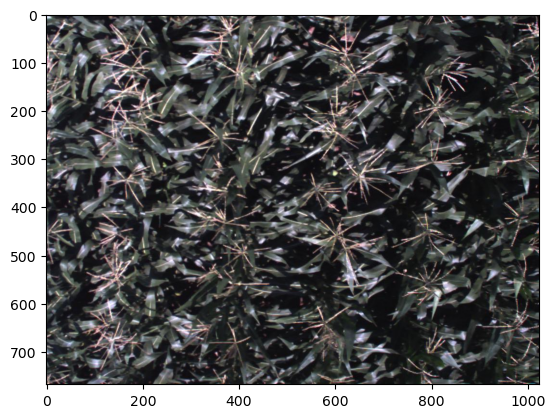

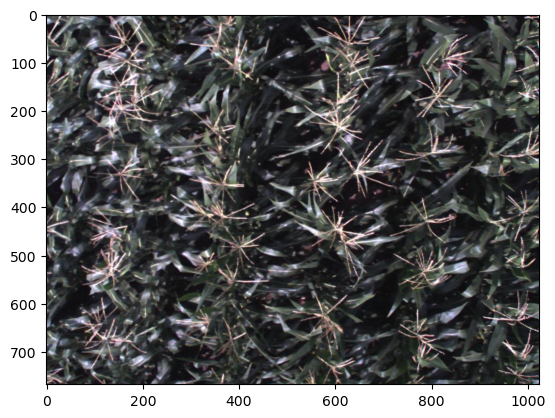

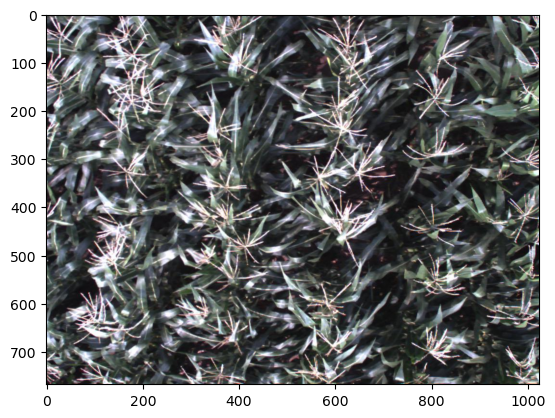

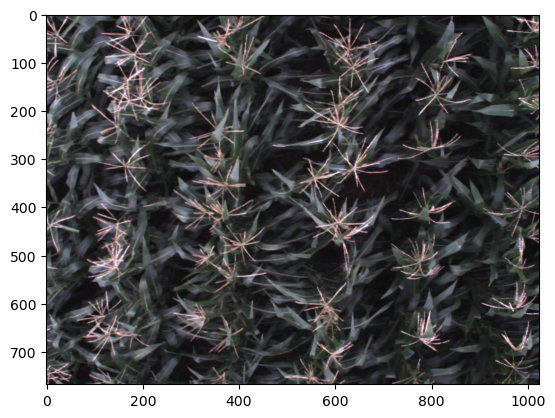

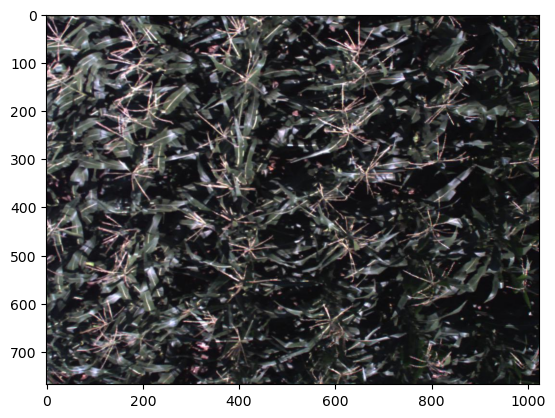

...

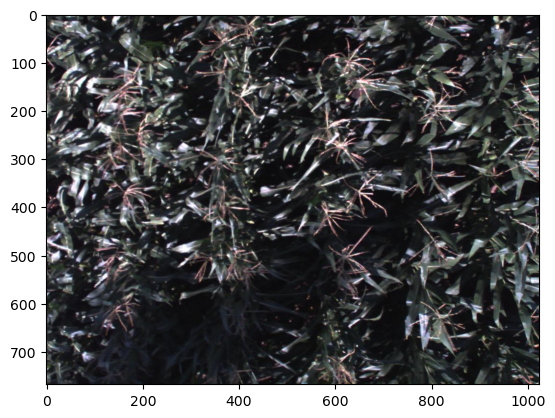

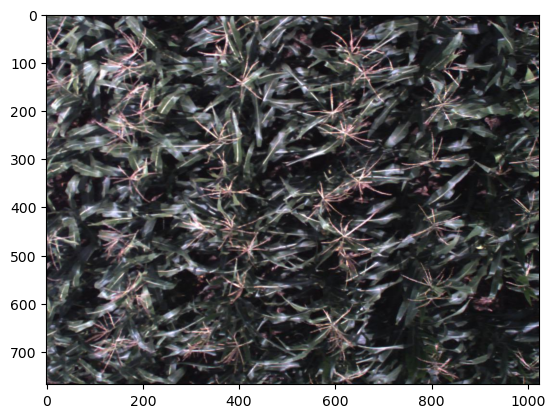

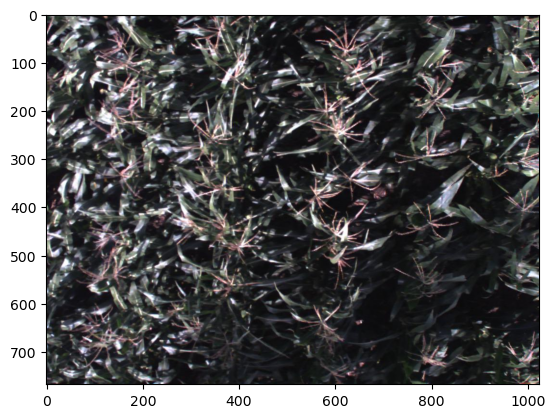

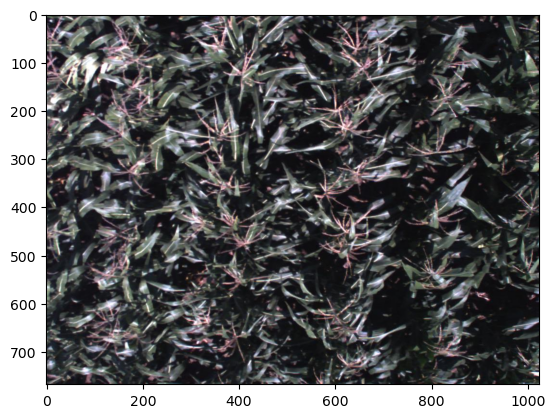

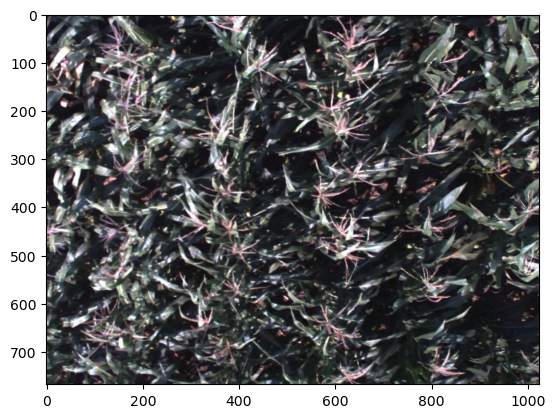

In [14]:
images_0102 = []
for file in task_spec_im_files_0102:
    joined_path = os.path.join(block_0102, file)
    read_image = plt.imread(joined_path)
    plt.imshow(read_image)
    plt.show()
    images_0102.append(read_image)

In [15]:
%%time

# get the function output

image_height = images_0102[0].shape[0]
image_weight = images_0102[0].shape[1]
stride = 8
kernel_size = 32
n_channels =3

stacked_sub_windows_0102, sub_window_name_list = create_and_stack_subwindows(image_height, image_weight, stride, kernel_size, n_channels, images_0102)

CPU times: user 40.8 s, sys: 4.13 s, total: 45 s
Wall time: 45.1 s


In [16]:
len(sub_window_name_list)

12288

In [17]:
sub_window_name_list[0], sub_window_name_list[1], sub_window_name_list[-1]

('sub_image_seq_0', 'sub_image_seq_1', 'sub_image_seq_12287')

In [18]:
stacked_sub_windows_0102.shape

(12288, 13, 32, 32, 3)

In [19]:
np.save('All_data/block_0102/subwindow_seqs_0102.npy', stacked_sub_windows_0102)

In [20]:
# xml files
task_spec_xml_files_0102

['Block0102_2020_08_26.xml',
 'Block0102_2020_08_27.xml',
 'Block0102_2020_08_28.xml',
 'Block0102_2020_08_31.xml',
 'Block0102_2020_09_02.xml',
 'Block0102_2020_09_07.xml',
 'Block0102_2020_09_16.xml']

In [21]:
# Corresponding image files
response_image_files_0102 = [file.split('.')[0] + '.jpeg' for file in task_spec_xml_files_0102]

In [22]:
response_image_files_0102

['Block0102_2020_08_26.jpeg',
 'Block0102_2020_08_27.jpeg',
 'Block0102_2020_08_28.jpeg',
 'Block0102_2020_08_31.jpeg',
 'Block0102_2020_09_02.jpeg',
 'Block0102_2020_09_07.jpeg',
 'Block0102_2020_09_16.jpeg']

In [23]:
# sort the file lists first just in case
task_spec_xml_files_0102.sort()
response_image_files_0102.sort()

In [24]:
len(task_spec_xml_files_0102), len(response_image_files_0102)

(7, 7)

In [25]:
old_path = block_0102
old_path

'../../../Spring_2024/S_lab_TasselNet/Block_2_TN/Block_2_images_and_xml'

In [26]:
new_store_path_0102 = 'All_data/block_0102/all_np_files'

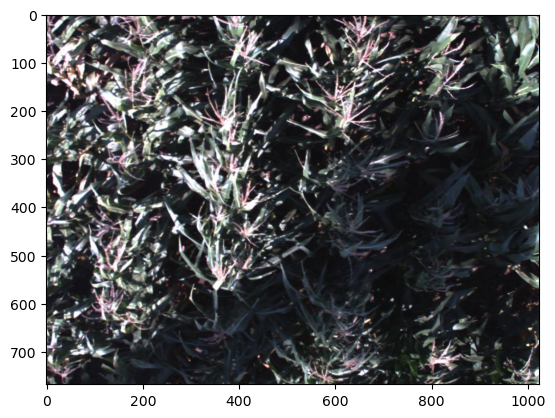

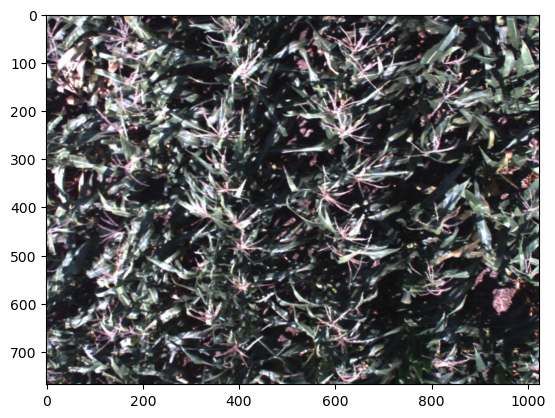

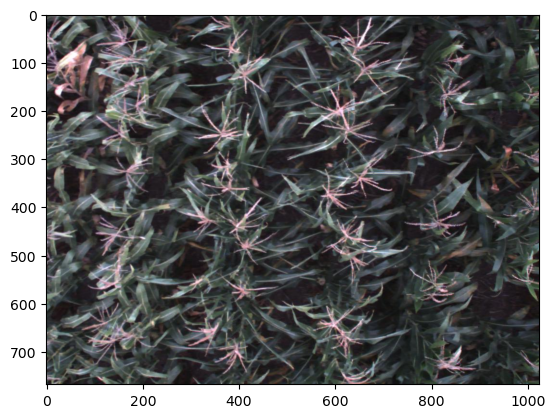

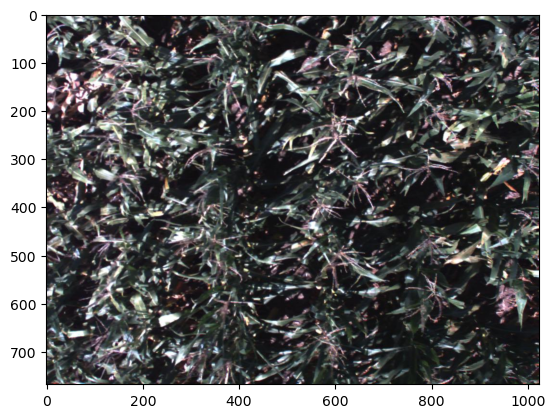

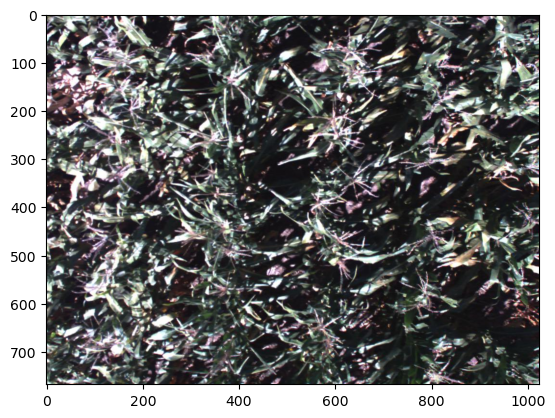

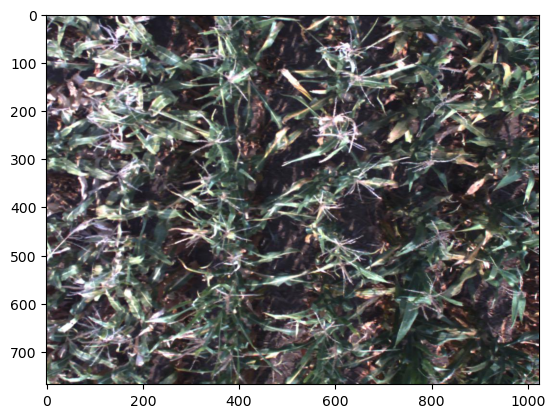

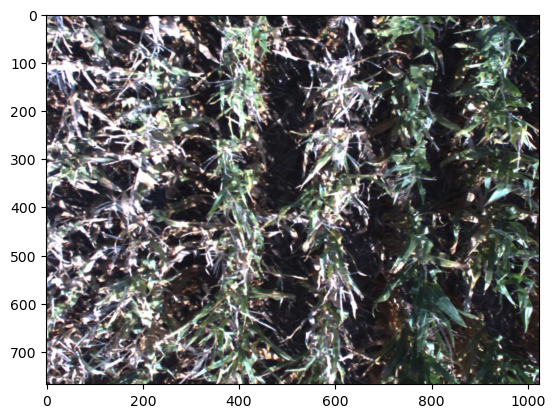

CPU times: user 1.91 s, sys: 445 ms, total: 2.36 s
Wall time: 17.1 s


In [27]:
%%time
all_im_sizes_0102 = []
for file in response_image_files_0102:
    im_size = store_images_as_np_arrays_horizontal(old_path, file, new_store_path_0102)
    all_im_sizes_0102.append(im_size)

In [28]:
all_im_sizes_0102

[(768, 1024, 3),
 (768, 1024, 3),
 (768, 1024, 3),
 (768, 1024, 3),
 (768, 1024, 3),
 (768, 1024, 3),
 (768, 1024, 3)]

In [29]:
# we need file names
block_0102_response_file_names = [file.split('.')[0] for file in task_spec_xml_files_0102]
block_0102_response_file_names

['Block0102_2020_08_26',
 'Block0102_2020_08_27',
 'Block0102_2020_08_28',
 'Block0102_2020_08_31',
 'Block0102_2020_09_02',
 'Block0102_2020_09_07',
 'Block0102_2020_09_16']

In [30]:
new_store_path_0102

'All_data/block_0102/all_np_files'

In [31]:
block_0102

'../../../Spring_2024/S_lab_TasselNet/Block_2_TN/Block_2_images_and_xml'

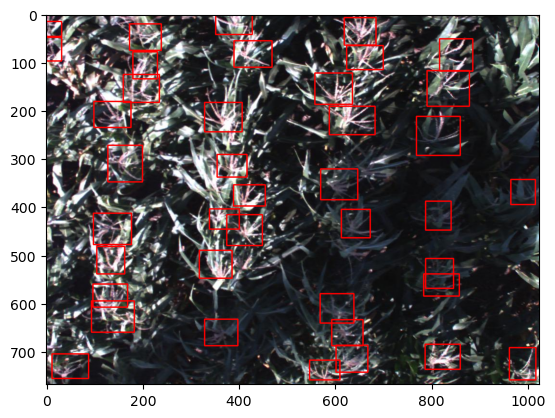

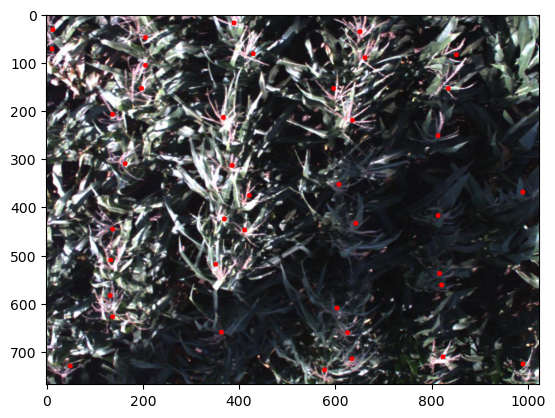

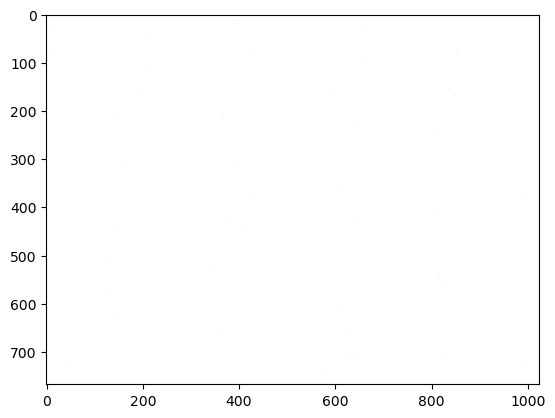

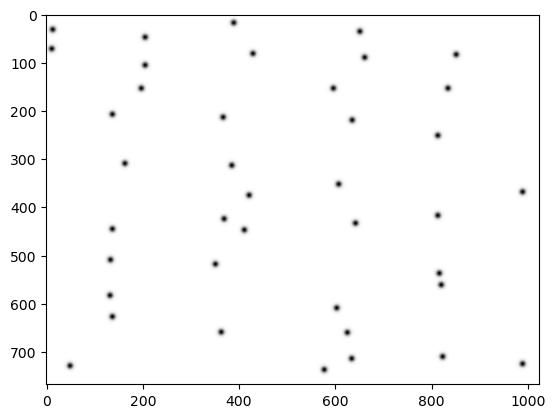

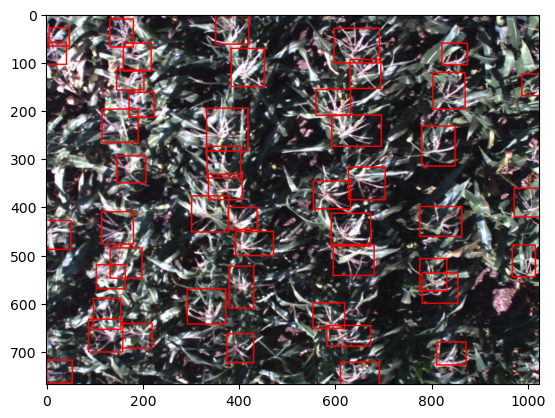

...

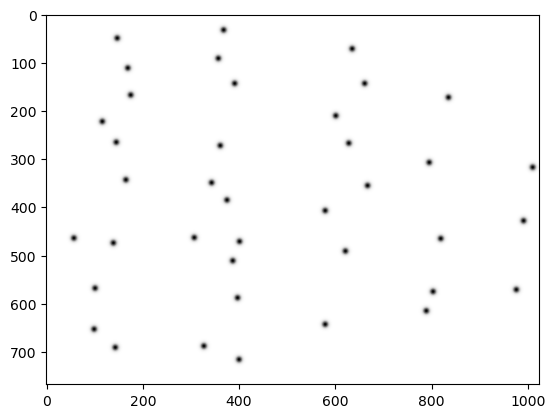

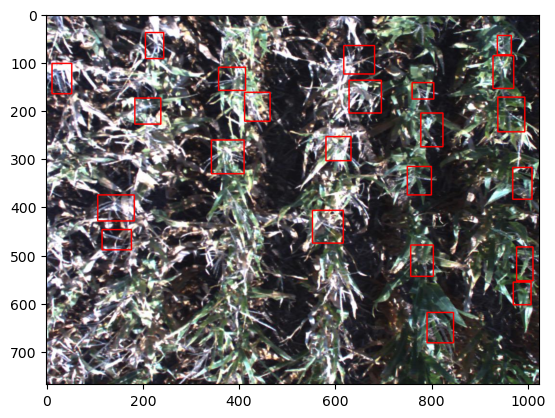

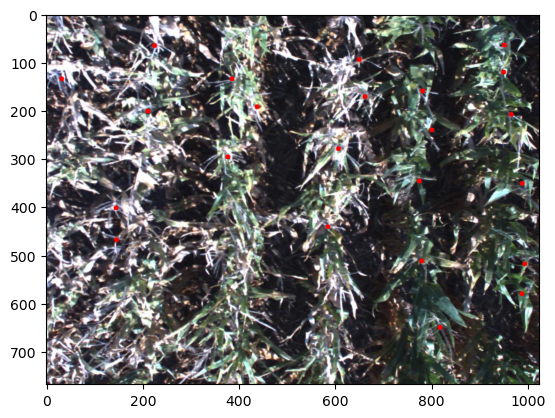

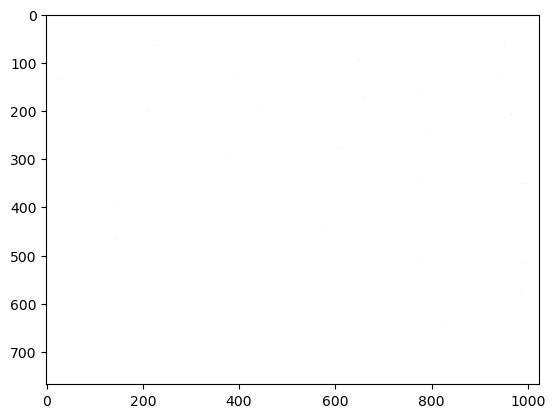

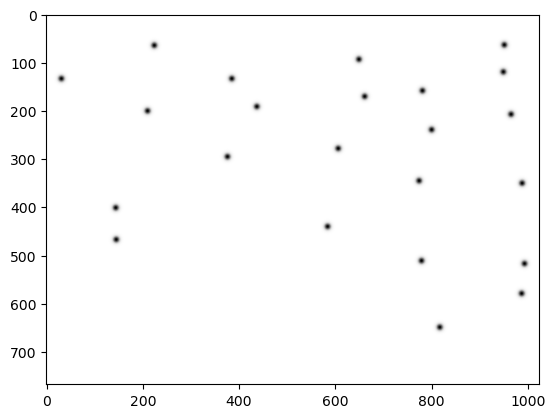

CPU times: user 21.7 s, sys: 1.95 s, total: 23.6 s
Wall time: 52.7 s


In [32]:
%%time
# let's run the function
function_results_0102 = []
for file_name in block_0102_response_file_names:
    result = get_density_maps_horizontal(file_name, new_store_path_0102, block_0102, new_store_path_0102)
    function_results_0102.append(result)

In [33]:
# let's first map the true and the convolved counts
true_counts_block_0102 = [file[2] for file in function_results_0102]
convolved_counts_block_0102 = [file[3] for file in function_results_0102]

In [34]:
# true_counts_block_0102

In [35]:
# convolved_counts_block_0102

In [36]:
np.mean(true_counts_block_0102 == np.round(convolved_counts_block_0102))

1.0

In [37]:
all_density_maps_0102 = [file[-1] for file in function_results_0102]

In [38]:
# one more sanity check - to make sure the convolved sums match with the density map sums
np.mean(convolved_counts_block_0102 == [np.sum(file) for file in all_density_maps_0102])

1.0

In [39]:
im_height = all_im_sizes_0102[0][0]
im_width = all_im_sizes_0102[0][1]
stride = 8
kernel_size = 32
im_height, im_width

(768, 1024)

In [40]:
%%time
# see if this works
stacked_responses_0102, response_name_list_0102 = tassel_density_sequences(im_height, im_width, stride, kernel_size, all_density_maps_0102)

CPU times: user 447 ms, sys: 4.21 ms, total: 451 ms
Wall time: 448 ms


In [41]:
stacked_responses_0102.shape

(12288, 7)

In [42]:
response_name_list_0102[0], response_name_list_0102[1], response_name_list_0102[-1]

('sub_dense_seq_0', 'sub_dense_seq_1', 'sub_dense_seq_12287')

In [43]:
# save the stacked response

In [44]:
np.save('All_data/block_0102/density_maps_seqs_0102.npy', stacked_responses_0102)